
<html>
<head>
<style>
    .data-category {
        background-color: #e6e6e6; /* Светло-серый фон для контейнеров категорий */
        border-left: 6px solid #31708f; /* Синий цвет границы для выделения */
        padding: 10px;
        margin-bottom: 10px; /* Добавляет пространство между категориями */
    }
    .data-category h3 {
        color: #31708f; /* Синий цвет заголовков для лучшей видимости */
        margin-top: 0;
    }
    .data-item p {
        margin: 5px 0;
        color: #000; /* Сделаем текст полностью непрозрачным */
        font-family: Arial, sans-serif;
    }
    .description {
        background-color: #dff0d8; /* Светло-зеленый фон для описательных блоков */
        padding: 10px;
        border-radius: 5px;
        margin-bottom: 20px; /* Добавляет пространство между описательным блоком и категориями */
        color: #3c763d; /* Зеленый цвет текста для лучшей видимости */
    }
</style>
</head>
<body><div class="description">
    <h1 style="color: #2F4F4F;">Трек Геоаналитика</h1>
    <h2 style="color: #2F4F4F;">Попытка бинарной классификации</h2>
    <h3 style="color: #2F4F4F;">LB скор: 20</h3>
</div>
<div class="data-category">
    <h3>Импорт библиотек</h3>
</div>
</div>
    <div class="data-item">
</div>
</body>
</html>

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import h3
import folium
from IPython.display import display, HTML
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier, sum_models
from statistics import mode 
from sklearn.utils import resample
from sklearn.utils.class_weight import compute_class_weight

pd.set_option('display.max_columns', 50)
warnings.filterwarnings('ignore')


<html>
<head>
<style>
    .data-category {
        background-color: #e6e6e6; /* Светло-серый фон для контейнеров категорий */
        border-left: 6px solid #31708f; /* Синий цвет границы для выделения */
        padding: 10px;
        margin-bottom: 10px; /* Добавляет пространство между категориями */
    }
    .data-category h3 {
        color: #31708f; /* Синий цвет заголовков для лучшей видимости */
        margin-top: 0;
    }
    .data-item p {
        margin: 5px 0;
        color: #000; /* Сделаем текст полностью непрозрачным */
        font-family: Arial, sans-serif;
    }
    .description {
        background-color: #dff0d8; /* Светло-зеленый фон для описательных блоков */
        padding: 10px;
        border-radius: 5px;
        margin-bottom: 20px; /* Добавляет пространство между описательным блоком и категориями */
        color: #3c763d; /* Зеленый цвет текста для лучшей видимости */
    }
</style>
</head>
<body>
<div class="data-category">
    <h3>Чтение данных</h3>
</div>
</div>
    <div class="data-item">
</div>
</body>
</html>

In [3]:
hexses_data = pd.read_csv('../data/hexses_data.lst').values
hexses_target = pd.read_csv('../data/hexses_target.lst').values
moscow_df = pd.read_parquet('../data/moscow.parquet')
target_df = pd.read_parquet('../data/target.parquet')
transactions_df = pd.read_parquet('../data/transactions.parquet')

<html>
<head>
<style>
    .data-category {
        background-color: #e6e6e6; /* Светло-серый фон для контейнеров категорий */
        border-left: 6px solid #31708f; /* Синий цвет границы для выделения */
        padding: 10px;
        margin-bottom: 10px; /* Добавляет пространство между категориями */
    }
    .data-category h3 {
        color: #31708f; /* Синий цвет заголовков для лучшей видимости */
        margin-top: 0;
    }
    .data-item p {
        margin: 5px 0;
        color: #000; /* Сделаем текст полностью непрозрачным */
        font-family: Arial, sans-serif;
    }
    .description {
        background-color: #dff0d8; /* Светло-зеленый фон для описательных блоков */
        padding: 10px;
        border-radius: 5px;
        margin-bottom: 20px; /* Добавляет пространство между описательным блоком и категориями */
        color: #3c763d; /* Зеленый цвет текста для лучшей видимости */
    }
</style>
</head>
<body>

<div class="data-category">
    <h3>Банковские данные</h3>
    <div class="data-item">
        <p><strong>Транзакции клиентов (transactions.parquet):</strong> Локация, Код клиента, Время суток, Количество совершенных операций, Сумма, Среднее, Минимум, Максимум, Стандартное отклонение, Количество уникальных типов операций, Тип операции.</p>
    </div>
    <div class="data-item">
        <p><strong>Целевая переменная (target.parquet):</strong> Локация использования банкомата, Код клиента.</p>
    </div>
</div>

<div class="data-category">
    <h3>Географические данные</h3>
    <div class="data-item">
        <p><strong>Локации банкоматов (hexses_target.lst)</strong></p>
        <p><strong>Локации транзакций клиентов (hexses_data.lst)</strong></p>
    </div>
</div>

<div class="data-category">
    <h3>Дополнительные пространственные данные</h3>
    <div class="data-item">
        <p><strong>OpenStreetMap Москвы (moscow.parquet):</strong> ID объекта, Описание объекта, Широта, Долгота.</p>
    </div>
    <div class="data-item">
    </div>
</div>

<div class="data-category">
    <h3>Особенности данных</h3>
    <div class="data-item">
        <p><strong>Внимание:</strong> статистики относятся не к клиенту в целом и не к локации в целом, а только к группе из транзакций, совершенных одновременно в одном месте. ID объекта, Описание объекта, Широта, Долгота.</p>
        <p>Иногда пользователь одновременно совершает несколько транзакций  в одном месте — по ним считаются статистики count sum min avg max std count_distinct.</p>
        <p>Банкоматы не обязательно расположены в тех же локациях, что и транзакции.</p>
    </div>
    <div class="data-item">
    </div>
</div>

</body>
</html>



<html>
<head>
<style>
    .data-category {
        background-color: #e6e6e6; /* Светло-серый фон для контейнеров категорий */
        border-left: 6px solid #31708f; /* Синий цвет границы для выделения */
        padding: 10px;
        margin-bottom: 10px; /* Добавляет пространство между категориями */
    }
    .data-category h3 {
        color: #31708f; /* Синий цвет заголовков для лучшей видимости */
        margin-top: 0;
    }
    .data-item p {
        margin: 5px 0;
        color: #000; /* Сделаем текст полностью непрозрачным */
        font-family: Arial, sans-serif;
    }
    .description {
        background-color: #dff0d8; /* Светло-зеленый фон для описательных блоков */
        padding: 10px;
        border-radius: 5px;
        margin-bottom: 20px; /* Добавляет пространство между описательным блоком и категориями */
        color: #3c763d; /* Зеленый цвет текста для лучшей видимости */
    }
</style>
</head>
<body>
<div class="data-category">
    <h3>Разведочный анализ данных и предобработка</h3>
</div>
</div>
    <div class="data-item">
</div>
</body>
</html>

In [4]:
print("Transactions dataset first 5 rows:")
display(transactions_df.head())

print("\nTarget dataset first 5 rows:")
display(target_df.head())

print("\nMoscow dataset first 5 rows:")
display(moscow_df.head())

print("\nTransactions dataset description:")
display(transactions_df.describe())

print("\nTarget dataset description:")
display(target_df.describe(include='all'))

print("\nMoscow dataset description:")
display(moscow_df.describe())

Transactions dataset first 5 rows:


,h3_09,customer_id,datetime_id,count,sum,avg,min,max,std,count_distinct,mcc_code
0,8911aa4c62fffff,1,3,1,3346.65,3346.650,3346.65,3346.65,NaN,1,13
1,8911aa7b5b3ffff,4,3,1,450.00,450.000,450.00,450.00,NaN,1,8
2,8911aa63623ffff,5,3,10,11035.69,1103.569,59.00,3620.18,1190.530333,6,13
3,8911aa48577ffff,9,2,2,628.00,314.000,295.00,333.00,26.870058,2,5
4,8911aa78297ffff,11,2,1,4155.00,4155.000,4155.00,4155.00,NaN,1,10



Target dataset first 5 rows:


,h3_09,customer_id
0,8911aa6ac3bffff,23172
1,8911aa7a857ffff,95640
2,8911aa70b97ffff,60350
3,8911aa70b97ffff,69521
4,891181b69abffff,29437



Moscow dataset first 5 rows:


,id,tags,lat,lon
0,1000,"[(comment, ООО ""АСП-ГРУПП"", ИНН 7735108290, до...",55.995115,37.207532
1,26609007,"[(ele, 190), (iata, SVO), (icao, UUEE), (name,...",55.987408,37.420944
2,26999673,"[(alt_name, Москва-Октябрьская), (esr:user, 06...",55.778834,37.653721
3,26999677,None,55.784881,37.649458
4,26999678,None,55.785265,37.649081



Transactions dataset description:


,customer_id,datetime_id,count,sum,avg,min,max,std,count_distinct,mcc_code
count,4.151096e+06,4.151096e+06,4.151096e+06,4.151096e+06,4.151096e+06,4.151096e+06,4.151096e+06,1.751545e+06,4.151096e+06,4.151096e+06
mean,4.674025e+04,2.100576e+00,3.238023e+00,2.633186e+03,1.290334e+03,1.087152e+03,1.579649e+03,5.911716e+02,1.736469e+00,9.640391e+00
std,2.749069e+04,8.460033e-01,6.292843e+00,1.858013e+04,1.056635e+04,8.965371e+03,1.421651e+04,8.948863e+03,2.391839e+00,4.075310e+00
min,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.299200e+04,2.000000e+00,1.000000e+00,2.789900e+02,1.833333e+02,1.050000e+02,2.100000e+02,5.656854e+01,1.000000e+00,8.000000e+00
50%,4.603800e+04,2.000000e+00,1.000000e+00,7.550000e+02,4.000000e+02,2.699700e+02,5.000000e+02,1.745140e+02,1.000000e+00,9.000000e+00
75%,6.996200e+04,3.000000e+00,3.000000e+00,2.200000e+03,9.800000e+02,7.376525e+02,1.288000e+03,4.501701e+02,2.000000e+00,1.300000e+01
max,9.845000e+04,3.000000e+00,4.150000e+02,2.195500e+07,1.097750e+07,9.001900e+06,1.540500e+07,6.261431e+06,1.220000e+02,2.300000e+01



Target dataset description:


,h3_09,customer_id
count,157806,157806.000000
unique,1657,NaN
top,8911aa7abd3ffff,NaN
freq,4338,NaN
mean,NaN,47693.492041
std,NaN,27753.500980
min,NaN,1.000000
25%,NaN,23730.250000
50%,NaN,47273.000000
75%,NaN,71422.500000



Moscow dataset description:


,id,lat,lon
count,8.867813e+06,8.867813e+06,8.867813e+06
mean,4.977225e+09,5.570707e+01,3.748515e+01
std,3.335162e+09,1.805554e-01,2.615887e-01
min,1.000000e+03,5.517190e+01,3.683400e+01
25%,1.993315e+09,5.560313e+01,3.731098e+01
50%,4.632416e+09,5.574129e+01,3.752900e+01
75%,7.636421e+09,5.583360e+01,3.766643e+01
max,1.157435e+10,5.601850e+01,3.795990e+01


In [5]:
print("Пропущенные значения в наборе данных Москвы:")
print(moscow_df.isnull().sum())

print("\nПропущенные значения в наборе данных транзакций:")
print(transactions_df.isnull().sum())

print("\nПропущенные значения в целевом наборе данных:")
print(target_df.isnull().sum())

Пропущенные значения в наборе данных Москвы:
id            0
tags    8296706
lat           0
lon           0
dtype: int64

Пропущенные значения в наборе данных транзакций:
h3_09                   0
customer_id             0
datetime_id             0
count                   0
sum                     0
avg                     0
min                     0
max                     0
std               2399551
count_distinct          0
mcc_code                0
dtype: int64

Пропущенные значения в целевом наборе данных:
h3_09          0
customer_id    0
dtype: int64


In [6]:
# Удаление дубликатов, если они есть. Пример для transactions_df:
transactions_df = transactions_df.drop_duplicates()

In [7]:
transactions_df['std'] = transactions_df['std'].fillna(0)

# Удаление аномально высоких значений транзакций
threshold = transactions_df['sum'].mean() + 2 * transactions_df['sum'].std()
transactions_df = transactions_df[transactions_df['sum'] <= threshold]

### Графики для галочки

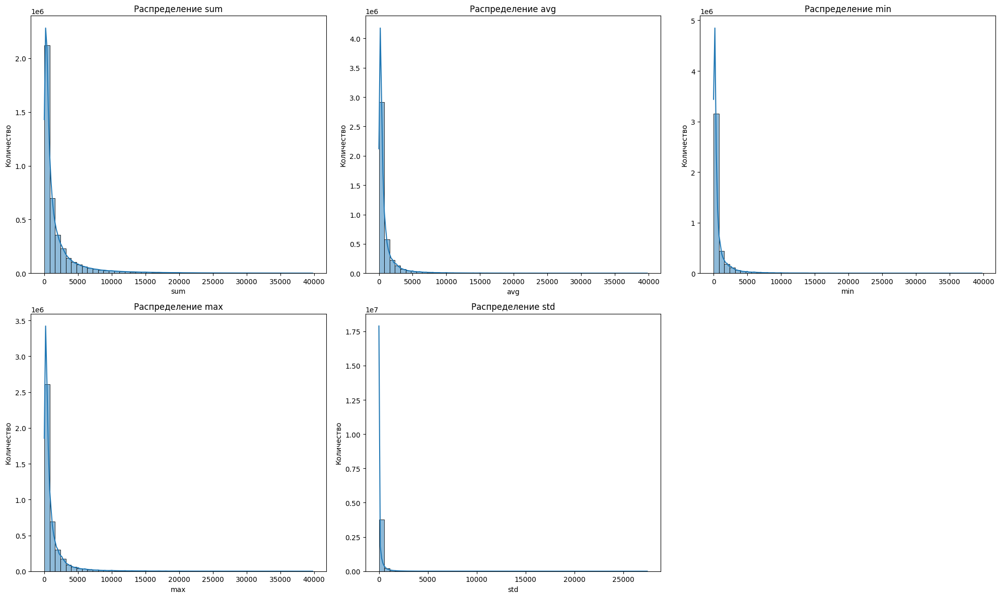

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Настройка размеров фигуры
plt.figure(figsize=(20, 12))

# Список колонок для визуализации
transaction_columns = ['sum', 'avg', 'min', 'max', 'std']

# Создание гистограмм для каждой колонки
for i, col in enumerate(transaction_columns, 1):
    plt.subplot(2, 3, i)  # 2 строки, 3 колонки, i-тый график
    sns.histplot(transactions_df[col], bins=50, kde=True)
    plt.title(f'Распределение {col}')
    plt.xlabel(col)
    plt.ylabel('Количество')

# Показываем графики
plt.tight_layout()
plt.show()


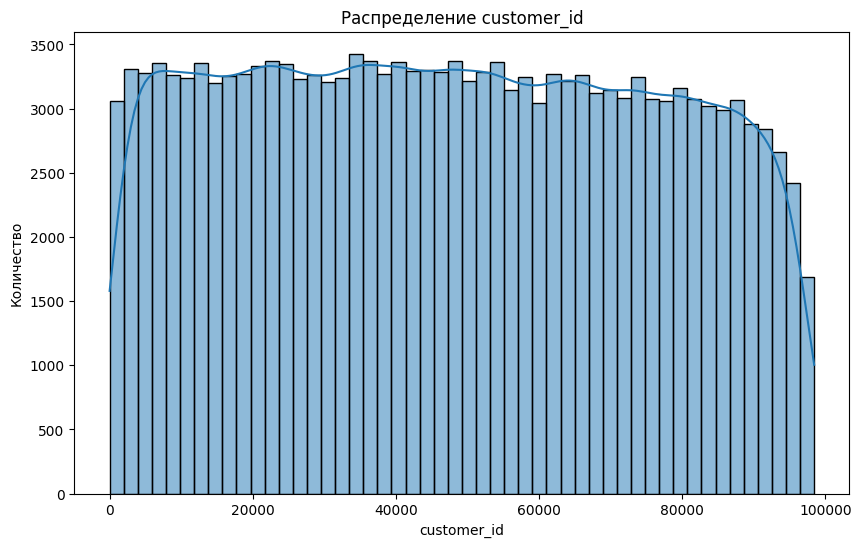

In [9]:
# Гистограмма для 'customer_id'
plt.figure(figsize=(10, 6))
sns.histplot(target_df['customer_id'], bins=50, kde=True)
plt.title('Распределение customer_id')
plt.xlabel('customer_id')
plt.ylabel('Количество')
plt.show()


### Банкоматы hexses_data и hexses_target на карте

In [11]:
df = pd.DataFrame({'h3_09': hexses_data.squeeze()})

moscow_lat, moscow_lng = 55.7558, 37.6173

df['polygons'] = df['h3_09'].apply(lambda x: h3.h3_to_geo_boundary(x, geo_json=False))

map1 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

for _, row in df.iterrows():
    folium.Polygon(locations=row['polygons'], color="blue", weight=2, fill=True, fill_color="blue", fill_opacity=0.4).add_to(map1)



df = pd.DataFrame({'h3_09': hexses_target.squeeze()})

df['polygons'] = df['h3_09'].apply(lambda x: h3.h3_to_geo_boundary(x, geo_json=False))

map2 = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

for _, row in df.iterrows():
    folium.Polygon(locations=row['polygons'], color="blue", weight=2, fill=True, fill_color="blue", fill_opacity=0.4).add_to(map2)

# Convert Folium map to HTML
map1_html = map1._repr_html_()
map2_html = map2._repr_html_()

# HTML template for displaying the maps side by side
template = """
<div style="display: flex;">
    <div style="width: 50%;">{map1}</div>
    <div style="width: 50%;">{map2}</div>
</div>
""".format(map1=map1_html, map2=map2_html)

# Display the maps
display(HTML(template))

### Работа с moscow_df

In [13]:
not_empty_moscow_df = moscow_df.dropna()
not_empty_moscow_df

,id,tags,lat,lon
0,1000,"[(comment, ООО ""АСП-ГРУПП"", ИНН 7735108290, до...",55.995115,37.207532
1,26609007,"[(ele, 190), (iata, SVO), (icao, UUEE), (name,...",55.987408,37.420944
2,26999673,"[(alt_name, Москва-Октябрьская), (esr:user, 06...",55.778834,37.653721
16,26999981,"[(name, Подрезково), (name:en, Podrezkovo), (p...",55.941962,37.334361
18,26999985,"[(esr:user, 060406), (express:user, 2005090), ...",55.949653,37.299001
...,...,...,...,...
8867761,11574072808,"[(addr:flats, 1-18), (entrance, staircase), (r...",55.788764,37.639026
8867766,11574072813,"[(barrier, bollard)]",55.788792,37.639404
8867769,11574072816,"[(barrier, lift_gate), (bicycle, yes), (foot, ...",55.788636,37.639270
8867774,11574347530,"[(amenity, library), (contact:telegram, https:...",55.770631,37.675718


In [14]:
not_empty_moscow_df['tags'][0]

[('comment', 'ООО "АСП-ГРУПП", ИНН 7735108290, до 22:45 c 2014-05-23'),
 ('name', 'Десяточка'),
 ('opening_hours', '08:30-22:45'),
 ('shop', 'supermarket')]

#### Взял ключевае слова в keys

In [16]:
not_empty_moscow_df['keys'] = not_empty_moscow_df['tags'].apply(lambda x: [y[0] for y in x])
not_empty_moscow_df['keys'] = not_empty_moscow_df['keys'].apply(lambda x: ' '.join([str(y) for y in x]))
not_empty_moscow_df.head()

,id,tags,lat,lon,keys
0,1000,"[(comment, ООО ""АСП-ГРУПП"", ИНН 7735108290, до...",55.995115,37.207532,comment name opening_hours shop
1,26609007,"[(ele, 190), (iata, SVO), (icao, UUEE), (name,...",55.987408,37.420944,ele iata icao name source website wikidata wik...
2,26999673,"[(alt_name, Москва-Октябрьская), (esr:user, 06...",55.778834,37.653721,alt_name esr:user loc_name loc_name:website na...
16,26999981,"[(name, Подрезково), (name:en, Podrezkovo), (p...",55.941962,37.334361,name name:en public_transport railway train
18,26999985,"[(esr:user, 060406), (express:user, 2005090), ...",55.949653,37.299001,esr:user express:user name name:en operator:br...


### Преобразование h3 индекса в широту и долготу

In [17]:
import h3

def h3_to_latlng(h3_index):
    lat, lng = h3.h3_to_geo(h3_index)
    return lat, lng

def latlng_to_h3(lat, lng, resolution=9):
    return h3.geo_to_h3(lat, lng, resolution)

transactions_df['trans_lat'] = transactions_df['h3_09'].apply(lambda x: h3_to_latlng(x)[0])
transactions_df['trans_lng'] = transactions_df['h3_09'].apply(lambda x: h3_to_latlng(x)[1])

In [18]:
# некоторые фичи, которые можно вынуть из индекса h3

def add_h3_features(df, h3_column_name):
    df['h3_area'] = df[h3_column_name].apply(lambda x: h3.cell_area(x, unit='m^2'))
    
    parent_level = 8  
    child_level = 10
    df['h3_parent_index'] = df[h3_column_name].apply(lambda x: h3.h3_to_parent(x, parent_level))
    df['parent_lat'] = df['h3_parent_index'].apply(lambda x: h3_to_latlng(x)[0])
    df['parent_lng'] = df['h3_parent_index'].apply(lambda x: h3_to_latlng(x)[1])
    
    df['h3_grandparent_index'] = df['h3_parent_index'].apply(lambda x: h3.h3_to_parent(x, 7))
    df['grandparent_lat'] = df['h3_grandparent_index'].apply(lambda x: h3_to_latlng(x)[0])
    df['grandparent_lng'] = df['h3_grandparent_index'].apply(lambda x: h3_to_latlng(x)[1])
    
    df = df.drop(columns=['h3_grandparent_index', 'h3_parent_index'])

    return df

transactions_df = add_h3_features(transactions_df, 'h3_09')

In [19]:
transactions_df.head()

,h3_09,customer_id,datetime_id,count,sum,avg,min,max,std,count_distinct,mcc_code,trans_lat,trans_lng,h3_area,parent_lat,parent_lng,grandparent_lat,grandparent_lng
0,8911aa4c62fffff,1,3,1,3346.65,3346.650,3346.65,3346.65,0.000000,1,13,55.565522,37.445024,98575.929237,55.565814,37.439905,55.560949,37.428592
1,8911aa7b5b3ffff,4,3,1,450.00,450.000,450.00,450.00,0.000000,1,8,55.699940,37.502864,98595.608823,55.699649,37.508002,55.691334,37.508937
2,8911aa63623ffff,5,3,10,11035.69,1103.569,59.00,3620.18,1190.530333,6,13,55.784319,37.665680,98761.754503,55.784319,37.665680,55.779463,37.654259
3,8911aa48577ffff,9,2,2,628.00,314.000,295.00,333.00,26.870058,2,5,55.472146,37.294992,98424.634484,55.469279,37.297017,55.472720,37.284787
4,8911aa78297ffff,11,2,1,4155.00,4155.000,4155.00,4155.00,0.000000,1,10,55.691497,37.602534,98721.395521,55.688626,37.604553,55.685162,37.616852


### Попытка поработать с moscow_df

In [25]:
# Корректная формула для дистанции между двумя точками на земном шаре
def haversine_vectorized(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a)) 
    km = 6371 * c 
    return km


def find_3_closest_from_moscow(lat, lng, moscow: pd.DataFrame):

    distances = haversine_vectorized(lat, lng, moscow['lat'].values, moscow['lon'].values)
    
    min_indices = np.argsort(distances)[:3]

    closest = [{'tag': moscow.iloc[i]['keys'], 'distance': distances[i]} for i in min_indices]
    
    return closest

find_3_closest_from_moscow(transactions_df.loc[1]['trans_lat'], transactions_df.loc[1]['trans_lng'], not_empty_moscow_df)

[{'tag': 'bench bin bus highway lit name name:uk operator public_transport shelter',
  'distance': 0.04579975414230497},
 {'tag': 'bus name public_transport', 'distance': 0.05099823698796927},
 {'tag': 'barrier', 'distance': 0.05368724568656104}]

### Аггрегация по customer_id

In [26]:
new_trans_df = transactions_df.copy()

new_trans_df['customer_id'] = new_trans_df['customer_id'].astype(int)

customer_data = new_trans_df.groupby(by='customer_id', as_index=False).agg(
    sum_mean=pd.NamedAgg('sum', 'mean'),
    sum_min=pd.NamedAgg('sum', 'min'),
    sum_max=pd.NamedAgg('sum', 'max'),
    sum_std=pd.NamedAgg('sum', 'std'),
    
    avg_mean=pd.NamedAgg('avg', 'mean'),
    avg_min=pd.NamedAgg('avg', 'min'),
    avg_max=pd.NamedAgg('avg', 'max'),
    avg_std=pd.NamedAgg('avg', 'std'),
    
    min_min = pd.NamedAgg('min', 'min'),
    max_max = pd.NamedAgg('max', 'max'),
    
    count_mean=pd.NamedAgg('count', 'mean'),
    count_min=pd.NamedAgg('count', 'min'),
    count_max=pd.NamedAgg('count', 'max'),
    count_std=pd.NamedAgg('count', 'std'),
    
    cd_mean=pd.NamedAgg('count_distinct', 'mean'),
    cd_min=pd.NamedAgg('count_distinct', 'min'),
    cd_max=pd.NamedAgg('count_distinct', 'max'),
    cd_std=pd.NamedAgg('count_distinct', 'std'),
    
    trans_lat_mean=pd.NamedAgg('trans_lat', 'mean'),
    trans_lat_min=pd.NamedAgg('trans_lat', 'min'),
    trans_lat_max=pd.NamedAgg('trans_lat', 'max'),
    trans_lat_std=pd.NamedAgg('trans_lat', 'std'),
    
    trans_lng_mean=pd.NamedAgg('trans_lng', 'mean'),
    trans_lng_min=pd.NamedAgg('trans_lng', 'min'),
    trans_lng_max=pd.NamedAgg('trans_lng', 'max'),
    trans_lng_std=pd.NamedAgg('trans_lng', 'std'),
    
    parent_lat_mean=pd.NamedAgg('parent_lat', 'mean'),
    parent_lat_min=pd.NamedAgg('parent_lat', 'min'),
    parent_lat_max=pd.NamedAgg('parent_lat', 'max'),
    parent_lat_std=pd.NamedAgg('parent_lat', 'std'),
    
    parent_lng_mean=pd.NamedAgg('parent_lng', 'mean'),
    parent_lng_min=pd.NamedAgg('parent_lng', 'min'),
    parent_lng_max=pd.NamedAgg('parent_lng', 'max'),
    parent_lng_std=pd.NamedAgg('parent_lng', 'std'),
    
    grandparent_lat_mean=pd.NamedAgg('parent_lat', 'mean'),
    grandparent_lat_min=pd.NamedAgg('parent_lat', 'min'),
    grandparent_lat_max=pd.NamedAgg('parent_lat', 'max'),
    grandparent_lat_std=pd.NamedAgg('parent_lat', 'std'),
    
    grandparent_lng_mean=pd.NamedAgg('grandparent_lng', 'mean'),
    grandparent_lng_min=pd.NamedAgg('grandparent_lng', 'min'),
    grandparent_lng_max=pd.NamedAgg('grandparent_lng', 'max'),
    grandparent_lng_std=pd.NamedAgg('grandparent_lng', 'std'),
    
    mcc_code_mode=pd.NamedAgg('mcc_code', mode),
    datetime_mode=pd.NamedAgg('datetime_id', mode),
)

customer_data.head()

,customer_id,sum_mean,sum_min,sum_max,sum_std,avg_mean,avg_min,avg_max,avg_std,min_min,max_max,count_mean,count_min,count_max,count_std,cd_mean,cd_min,cd_max,cd_std,trans_lat_mean,trans_lat_min,trans_lat_max,trans_lat_std,trans_lng_mean,trans_lng_min,trans_lng_max,trans_lng_std,parent_lat_mean,parent_lat_min,parent_lat_max,parent_lat_std,parent_lng_mean,parent_lng_min,parent_lng_max,parent_lng_std,grandparent_lat_mean,grandparent_lat_min,grandparent_lat_max,grandparent_lat_std,grandparent_lng_mean,grandparent_lng_min,grandparent_lng_max,grandparent_lng_std,mcc_code_mode,datetime_mode
0,1,1873.168611,50.0,27952.65,4099.268736,894.084370,37.500,7827.60,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.226170,37.664566,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.226170,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2
1,4,1355.774253,27.8,19548.56,2501.633388,346.030548,23.205,3850.00,556.637392,3.0,3850.00,6.471264,1,44,10.288670,2.298851,1,17,2.606410,55.670956,55.592803,55.824516,0.065072,37.483404,37.289803,37.922115,0.177475,55.671138,55.589936,55.824516,0.065028,37.482943,37.289803,37.925265,0.180000,55.671138,55.589936,55.824516,0.065028,37.483867,37.278504,37.912956,0.179718,8,3
2,5,1804.113333,4.0,11035.69,2188.518766,1202.251856,4.000,7538.00,1342.738428,4.0,7538.00,1.597701,1,10,1.474274,1.298851,1,6,0.850649,55.743464,55.608587,55.845508,0.068165,37.654474,37.360099,37.925265,0.087372,55.743446,55.608885,55.845508,0.068538,37.655340,37.360099,37.925265,0.087182,55.743446,55.608885,55.845508,0.068538,37.657664,37.359132,37.912956,0.086105,8,3
3,9,2457.110968,54.0,23707.00,4651.378429,439.067496,54.000,2331.48,508.592483,8.0,2331.48,7.451613,1,75,14.735080,1.193548,1,3,0.542792,55.587875,55.471859,55.852402,0.125663,37.389115,36.918866,37.922115,0.283393,55.587751,55.469279,55.855265,0.126303,37.389682,36.916821,37.925265,0.285035,55.587751,55.469279,55.855265,0.126303,37.386747,36.928005,37.912956,0.281408,13,1
4,11,6825.972308,112.0,36078.00,8377.164609,3692.381975,56.000,31670.00,4861.871828,40.0,31670.00,2.784615,1,45,5.893567,1.461538,1,8,1.225726,55.726734,55.611163,55.910028,0.057496,37.602943,37.508629,37.922115,0.107719,55.725709,55.608885,55.910316,0.057181,37.603059,37.511740,37.925265,0.108847,55.725709,55.608885,55.910316,0.057181,37.603487,37.523100,37.912956,0.105936,8,3


In [27]:
hexses_data = hexses_data.squeeze()

<html>
<head>
<style>
    .data-category {
        background-color: #e6e6e6; /* Светло-серый фон для контейнеров категорий */
        border-left: 6px solid #31708f; /* Синий цвет границы для выделения */
        padding: 10px;
        margin-bottom: 10px; /* Добавляет пространство между категориями */
    }
    .data-category h3 {
        color: #31708f; /* Синий цвет заголовков для лучшей видимости */
        margin-top: 0;
    }
    .data-item p {
        margin: 5px 0;
        color: #000; /* Сделаем текст полностью непрозрачным */
        font-family: Arial, sans-serif;
    }
    .description {
        background-color: #dff0d8; /* Светло-зеленый фон для описательных блоков */
        padding: 10px;
        border-radius: 5px;
        margin-bottom: 20px; /* Добавляет пространство между описательным блоком и категориями */
        color: #3c763d; /* Зеленый цвет текста для лучшей видимости */
    }
</style>
</head>
<body>
<div class="data-category">
    <h3>Подготовка данных к обучению</h3>
</div>
</div>
    <div class="data-item">
</div>
</body>
</html>

### Для каждого банкомата из hexses_data строится строчка: customer_id, его фичи, Локация банкомата из hexses_data. На основе target_df выбирается использовал ли клиент определенный банкомат - used_atm: 0 или 1

### По скольку полуится многовато данных для бинарной классификации (~500М), делаю генератор для батчевой выдачи данных

Внутри есть разработка фич: считаю расстояния от банкоматов к транзакциям

,customer_id,sum_mean,sum_min,sum_max,sum_std,avg_mean,avg_min,avg_max,avg_std,min_min,max_max,count_mean,count_min,count_max,count_std,cd_mean,cd_min,cd_max,cd_std,trans_lat_mean,trans_lat_min,trans_lat_max,trans_lat_std,trans_lng_mean,trans_lng_min,...,trans_lng_std,parent_lat_mean,parent_lat_min,parent_lat_max,parent_lat_std,parent_lng_mean,parent_lng_min,parent_lng_max,parent_lng_std,grandparent_lat_mean,grandparent_lat_min,grandparent_lat_max,grandparent_lat_std,grandparent_lng_mean,grandparent_lng_min,grandparent_lng_max,grandparent_lng_std,mcc_code_mode,datetime_mode,used_atm,target_lat,target_lng,mean_distance,min_distance,max_distance
0,1,1873.168611,50.00,27952.65,4099.268736,894.08437,37.50,7827.6,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.22617,...,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.226170,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2,0,55.247340,37.326151,42.377785,14.902732,65.898700
1,1,1873.168611,50.00,27952.65,4099.268736,894.08437,37.50,7827.6,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.22617,...,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.226170,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2,0,55.215345,37.163678,48.900540,17.503425,73.074897
2,1,1873.168611,50.00,27952.65,4099.268736,894.08437,37.50,7827.6,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.22617,...,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.226170,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2,0,55.322955,37.399937,33.295346,12.106453,56.461325
3,1,1873.168611,50.00,27952.65,4099.268736,894.08437,37.50,7827.6,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.22617,...,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.226170,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2,0,55.309257,37.350979,35.316360,10.293621,58.877837
4,1,1873.168611,50.00,27952.65,4099.268736,894.08437,37.50,7827.6,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.22617,...,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.226170,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2,0,55.351888,37.423617,29.933039,12.618536,52.948733
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
815295,63,1586.563511,35.99,8328.71,1979.901682,754.74002,35.99,5800.0,995.481301,25.0,5800.00,2.382979,1,26,2.966140,1.436170,1,4,0.769842,55.648388,55.566484,55.780645,0.059805,37.441072,37.26307,...,0.124116,55.648239,55.569357,55.779343,0.059877,37.440077,37.268189,37.913812,0.124056,55.648239,55.569357,55.779343,0.059877,37.440170,37.256899,37.912956,0.123063,13,2,0,55.648052,37.495102,3.390277,17.165713,30.087189
815296,63,1586.563511,35.99,8328.71,1979.901682,754.74002,35.99,5800.0,995.481301,25.0,5800.00,2.382979,1,26,2.966140,1.436170,1,4,0.769842,55.648388,55.566484,55.780645,0.059805,37.441072,37.26307,...,0.124116,55.648239,55.569357,55.779343,0.059877,37.440077,37.268189,37.913812,0.124056,55.648239,55.569357,55.779343,0.059877,37.440170,37.256899,37.912956,0.123063,13,2,0,55.648635,37.484840,2.746277,16.657337,30.617834
815297,63,1586.563511,35.99,8328.71,1979.901682,754.74002,35.99,5800.0,995.481301,25.0,5800.00,2.382979,1,26,2.966140,1.436170,1,4,0.769842,55.648388,55.566484,55.780645,0.059805,37.441072,37.26

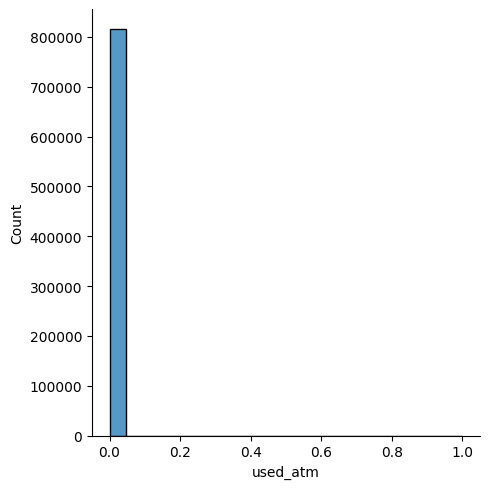

In [28]:
def train_data_generator(customer_data, target_df, hexses_data, chunk_size=10000):
    
    unique_atms = pd.DataFrame({'h3_09': hexses_data})


    customer_target = pd.merge(customer_data, target_df, on='customer_id', how='left')


    for chunk_start in range(0, len(customer_target), chunk_size):

        customer_chunk = customer_target.iloc[chunk_start:chunk_start + chunk_size].copy()

        expanded_chunk = customer_chunk.assign(key=1).merge(unique_atms.assign(key=1), on='key').drop('key', axis=1)

        expanded_chunk['used_atm'] = (expanded_chunk['h3_09_x'] == expanded_chunk['h3_09_y']).astype(int)


        expanded_chunk = expanded_chunk.rename(columns={'h3_09_y': 'h3_09'}).drop(columns=['h3_09_x'])

        expanded_chunk['target_lat'] = expanded_chunk['h3_09'].apply(lambda x: h3_to_latlng(x)[0])
        expanded_chunk['target_lng'] = expanded_chunk['h3_09'].apply(lambda x: h3_to_latlng(x)[1])
        
        #expanded_chunk = add_h3_features(expanded_chunk, 'h3_09')
        
        expanded_chunk = expanded_chunk.drop(columns=['h3_09'])
        
        
        expanded_chunk['mean_distance'] = haversine_vectorized(
            expanded_chunk['trans_lng_mean'],
            expanded_chunk['trans_lat_mean'],
            expanded_chunk['target_lng'],
            expanded_chunk['target_lat']
        )
        
        expanded_chunk['min_distance'] = haversine_vectorized(
            expanded_chunk['trans_lng_min'],
            expanded_chunk['trans_lat_min'],
            expanded_chunk['target_lng'],
            expanded_chunk['target_lat']
        )
        
        expanded_chunk['max_distance'] = haversine_vectorized(
            expanded_chunk['trans_lng_max'],
            expanded_chunk['trans_lat_max'],
            expanded_chunk['target_lng'],
            expanded_chunk['target_lat']
        )

        yield expanded_chunk

generator = train_data_generator(customer_data, target_df, hexses_data, chunk_size=100)

for chunk in generator:
    display(chunk)
    sns.displot(chunk['used_atm'])
    break



<html>
<head>
<style>
    .data-category {
        background-color: #e6e6e6; /* Светло-серый фон для контейнеров категорий */
        border-left: 6px solid #31708f; /* Синий цвет границы для выделения */
        padding: 10px;
        margin-bottom: 10px; /* Добавляет пространство между категориями */
    }
    .data-category h3 {
        color: #31708f; /* Синий цвет заголовков для лучшей видимости */
        margin-top: 0;
    }
    .data-item p {
        margin: 5px 0;
        color: #000; /* Сделаем текст полностью непрозрачным */
        font-family: Arial, sans-serif;
    }
    .description {
        background-color: #dff0d8; /* Светло-зеленый фон для описательных блоков */
        padding: 10px;
        border-radius: 5px;
        margin-bottom: 20px; /* Добавляет пространство между описательным блоком и категориями */
        color: #3c763d; /* Зеленый цвет текста для лучшей видимости */
    }
</style>
</head>
<body>
<div class="data-category">
    <h3>Обучение</h3>
</div>
</div>
    <div class="data-item">
</div>
</body>
</html>

In [29]:
train_generator = train_data_generator(customer_data, target_df, hexses_data, chunk_size=100)

### Помотрев на распределение классов выше, понятно что есть явный дисбаланс. В этом случае я использую либо андерсемплинг, либо работаю с весами классов для модели. Первое получается лучше

### Кстати, в этом случае используется подход наращивания модели: складываются предыдущая модель с настоящей для обучения на следующем батче

In [32]:
all_models = []

k = 1

# сколько раз модель обучится
num_models = 100

clf = None

for chunk in train_generator:
    print('-----------', k, '----------')
    
    #"""
    df_majority = chunk[chunk['used_atm'] == 0]
    df_minority = chunk[chunk['used_atm'] == 1]
    
    df_majority_downsampled = resample(df_majority, 
                                    replace=False,    
                                    n_samples=len(df_minority),    
                                    random_state=123) 

    df_downsampled = pd.concat([df_majority_downsampled, df_minority])


    X = df_downsampled.drop(['customer_id', 'used_atm'], axis=1)
    y = df_downsampled['used_atm']
    #"""
    
    # X, y = chunk.drop(columns=['used_atm', 'customer_id']), chunk['used_atm']
    x_train, x_valid, y_train, y_valid = train_test_split(X, y, random_state=42)
    
    if clf == None:
        
        class_weights = compute_class_weight(class_weight='balanced', classes=np.array([0, 1]), y=y_train)
        
        clf = CatBoostClassifier(
            iterations=10000,
            early_stopping_rounds=20,
            l2_leaf_reg=2,
            use_best_model=True,
            class_weights=class_weights,
            bagging_temperature=1,
            eval_metric='F1'
        )
    else:
        
        clf1 = CatBoostClassifier(
            iterations=10000,
            early_stopping_rounds=20,
            l2_leaf_reg=2,
            use_best_model=True,
            class_weights=class_weights,
            bagging_temperature=1,
            eval_metric='F1'
        )
    
        clf1.fit(x_train, y_train, eval_set=(x_valid, y_valid), verbose=100)
    
        clf = sum_models([clf, clf1])
        
    all_models.append(clf)
    k += 1
    
    if k - 1 == num_models: break
    
    print('---------------')

----------- 1 ----------
---------------
----------- 2 ----------
0:	learn: 0.7931249	test: 0.7019231	best: 0.7019231 (0)	total: 58.1ms	remaining: 9m 41s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 0.7281795482
bestIteration = 9

Shrink model to first 10 iterations.
---------------
----------- 3 ----------
0:	learn: 0.7598939	test: 0.6162195	best: 0.6162195 (0)	total: 1.49ms	remaining: 14.9s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 0.6162194727
bestIteration = 0

Shrink model to first 1 iterations.
---------------
----------- 4 ----------
0:	learn: 0.8217395	test: 0.5760992	best: 0.5760992 (0)	total: 1.65ms	remaining: 16.5s
Stopped by overfitting detector  (20 iterations wait)

bestTest = 0.6162194727
bestIteration = 9

Shrink model to first 10 iterations.
---------------
----------- 5 ----------
0:	learn: 0.7300640	test: 0.6458391	best: 0.6458391 (0)	total: 918us	remaining: 9.18s
Stopped by overfitting detector  (20 iterations wait)

best

### Выбираю последнюю модель

In [33]:
meta_catboost_clf = all_models[-1]

### Сохраняю

In [34]:
meta_catboost_clf.save_model('../models/meta_catboost_clf')


<html>
<head>
<style>
    .data-category {
        background-color: #e6e6e6; /* Светло-серый фон для контейнеров категорий */
        border-left: 6px solid #31708f; /* Синий цвет границы для выделения */
        padding: 10px;
        margin-bottom: 10px; /* Добавляет пространство между категориями */
    }
    .data-category h3 {
        color: #31708f; /* Синий цвет заголовков для лучшей видимости */
        margin-top: 0;
    }
    .data-item p {
        margin: 5px 0;
        color: #000; /* Сделаем текст полностью непрозрачным */
        font-family: Arial, sans-serif;
    }
    .description {
        background-color: #dff0d8; /* Светло-зеленый фон для описательных блоков */
        padding: 10px;
        border-radius: 5px;
        margin-bottom: 20px; /* Добавляет пространство между описательным блоком и категориями */
        color: #3c763d; /* Зеленый цвет текста для лучшей видимости */
    }
</style>
</head>
<body>
<div class="data-category">
    <h3>Предсказание для hexses_target</h3>
</div>
</div>
    <div class="data-item">
</div>
</body>
</html>

In [36]:
meta_catboost_clf = CatBoostClassifier().load_model('../models/meta_catboost_clf')

In [37]:
def calculate_num_chunks(dataframe, chunk_size):
    num_chunks = np.ceil(len(dataframe) / chunk_size).astype(int)
    return num_chunks

num_chunks = calculate_num_chunks(customer_data, chunk_size=1000)
print(f"Total number of chunks to be generated: {num_chunks}")


Total number of chunks to be generated: 70


In [38]:
def test_data_generator(customer_df, hexses_data, chunk_size=10000):

    unique_atms = pd.DataFrame({'h3_09': hexses_data})
    
    unique_atms['key'] = 1
    customers_chunk_start = 0
    
    num_chunks = np.ceil(len(customer_df) / chunk_size).astype(int)
    
    for _ in range(num_chunks):

        customer_chunk = customer_df.iloc[customers_chunk_start:customers_chunk_start + chunk_size].copy()
        customer_chunk['key'] = 1  

        expanded_chunk = pd.merge(customer_chunk, unique_atms, on='key').drop('key', axis=1)
        
        expanded_chunk['target_lat'] = expanded_chunk['h3_09'].apply(lambda x: h3_to_latlng(x)[0])
        expanded_chunk['target_lng'] = expanded_chunk['h3_09'].apply(lambda x: h3_to_latlng(x)[1])
        
        #expanded_chunk = add_h3_features(expanded_chunk, 'h3_09')
        
        expanded_chunk['mean_distance'] = haversine_vectorized(
            expanded_chunk['trans_lng_mean'],
            expanded_chunk['trans_lat_mean'],
            expanded_chunk['target_lng'],
            expanded_chunk['target_lat']
        )
        
        expanded_chunk['min_distance'] = haversine_vectorized(
            expanded_chunk['trans_lng_min'],
            expanded_chunk['trans_lat_min'],
            expanded_chunk['target_lng'],
            expanded_chunk['target_lat']
        )
        
        expanded_chunk['max_distance'] = haversine_vectorized(
            expanded_chunk['trans_lng_max'],
            expanded_chunk['trans_lat_max'],
            expanded_chunk['target_lng'],
            expanded_chunk['target_lat']
        )

        customers_chunk_start += chunk_size
        
        yield expanded_chunk

generator = test_data_generator(customer_data, hexses_data, chunk_size=100)

for chunk in generator:
    display(chunk.head())  
    break

,customer_id,sum_mean,sum_min,sum_max,sum_std,avg_mean,avg_min,avg_max,avg_std,min_min,max_max,count_mean,count_min,count_max,count_std,cd_mean,cd_min,cd_max,cd_std,trans_lat_mean,trans_lat_min,trans_lat_max,trans_lat_std,trans_lng_mean,trans_lng_min,...,trans_lng_std,parent_lat_mean,parent_lat_min,parent_lat_max,parent_lat_std,parent_lng_mean,parent_lng_min,parent_lng_max,parent_lng_std,grandparent_lat_mean,grandparent_lat_min,grandparent_lat_max,grandparent_lat_std,grandparent_lng_mean,grandparent_lng_min,grandparent_lng_max,grandparent_lng_std,mcc_code_mode,datetime_mode,h3_09,target_lat,target_lng,mean_distance,min_distance,max_distance
0,1,1873.168611,50.0,27952.65,4099.268736,894.08437,37.5,7827.6,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.22617,...,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.22617,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2,89118180d27ffff,55.247340,37.326151,42.377785,14.902732,65.898700
1,1,1873.168611,50.0,27952.65,4099.268736,894.08437,37.5,7827.6,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.22617,...,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.22617,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2,891181820abffff,55.215345,37.163678,48.900540,17.503425,73.074897
2,1,1873.168611,50.0,27952.65,4099.268736,894.08437,37.5,7827.6,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.22617,...,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.22617,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2,891181840a7ffff,55.322955,37.399937,33.295346,12.106453,56.461325
3,1,1873.168611,50.0,27952.65,4099.268736,894.08437,37.5,7827.6,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.22617,...,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.22617,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2,891181844c3ffff,55.309257,37.350979,35.316360,10.293621,58.877837
4,1,1873.168611,50.0,27952.65,4099.268736,894.08437,37.5,7827.6,1386.230052,25.0,10970.73,2.069444,1,11,2.071445,1.472222,1,8,1.125532,55.619941,55.368683,55.808175,0.119468,37.467324,37.22617,...,0.135577,55.619977,55.368683,55.807881,0.119369,37.466686,37.22617,37.666586,0.136621,55.619977,55.368683,55.807881,0.119369,37.467671,37.227152,37.666944,0.137503,8,2,89118184c93ffff,55.351888,37.423617,29.933039,12.618536,52.948733


In [39]:
test_generator = test_data_generator(customer_df=customer_data, hexses_data=hexses_target.squeeze(), chunk_size=1000)

In [40]:
flag = 0

preds_df = pd.DataFrame({})

for chunk in test_generator:
    preds = meta_catboost_clf.predict_proba(chunk.drop(columns=['customer_id', 'h3_09']))
    preds_df_chunk = pd.DataFrame({'customer_id': chunk['customer_id'], 'h3_09': chunk['h3_09'], 'proba': [x[1] for x in preds]})
    
    if not flag:
        preds_df = preds_df_chunk
        flag += 1
    else:
        preds_df = pd.concat((preds_df.reindex(), preds_df_chunk.reindex()), axis=0)
        
        flag += 1
        
    print(flag)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70


In [41]:
preds_df.head()

,customer_id,h3_09,proba
0,1,89118195133ffff,1.652009e-10
1,1,8911819513bffff,1.662045e-10
2,1,891181b2827ffff,1.056529e-08
3,1,891181b2957ffff,3.011796e-08
4,1,891181b2b83ffff,5.307799e-09


<Axes: >

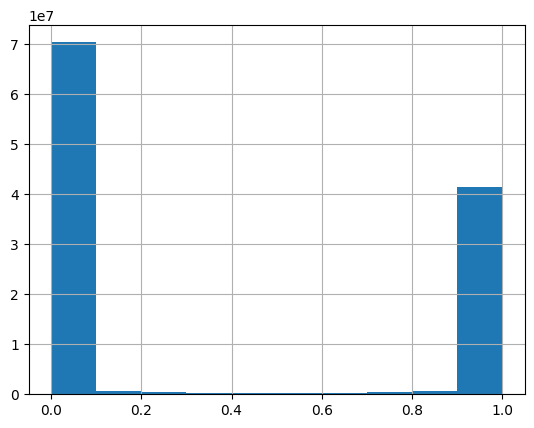

In [42]:
preds_df['proba'].hist()

In [43]:
preds_df['proba'] = preds_df.groupby('customer_id')['proba'].transform(lambda x: x / x.sum())

# Pivot the table
submit_df = preds_df.pivot(index='customer_id', columns='h3_09', values='proba').reset_index()

missing_cols = set(hexses_target.squeeze()) - set(submit_df.columns)
for col in missing_cols:
    submit_df[col] = 0.0  

submit_df = submit_df[['customer_id'] + sorted(set(hexses_target.squeeze()))]

submit_df.head()

h3_09,customer_id,89118195133ffff,8911819513bffff,891181b2827ffff,891181b2957ffff,891181b2b83ffff,891181b2b97ffff,891181b2ba7ffff,891181b2bb3ffff,891181b2d1bffff,891181b2e6bffff,891181b4513ffff,891181b451bffff,891181b45c3ffff,891181b45d7ffff,891181b4c8fffff,891181b4ca7ffff,891181b4cb3ffff,891181b4cd3ffff,891181b4d2fffff,891181b4d9bffff,891181b4da7ffff,891181b4dbbffff,891181b4dcbffff,891181b4dd3ffff,...,8911aa7b407ffff,8911aa7b42fffff,8911aa7b453ffff,8911aa7b45bffff,8911aa7b47bffff,8911aa7b4a7ffff,8911aa7b4afffff,8911aa7b4cfffff,8911aa7b4dbffff,8911aa7b54fffff,8911aa7b573ffff,8911aa7b583ffff,8911aa7b587ffff,8911aa7b593ffff,8911aa7b597ffff,8911aa7b5a7ffff,8911aa7b5b3ffff,8911aa7b617ffff,8911aa7b637ffff,8911aa7b643ffff,8911aa7b65bffff,8911aa7b663ffff,8911aa7b67bffff,8911aa7b687ffff,8911aa7b68fffff
0,1,5.388432e-13,5.421167e-13,3.446129e-11,9.823713e-11,1.731269e-11,2.441181e-11,1.348148e-11,1.506596e-11,3.078349e-08,4.451422e-13,1.077084e-10,7.876804e-11,1.096219e-10,2.000748e-10,2.991196e-12,2.618445e-12,2.871394e-12,2.592399e-12,3.015077e-12,2.477314e-12,2.842010e-12,2.579981e-12,2.097465e-12,2.527745e-12,...,3.261746e-03,3.261746e-03,3.261746e-03,3.261746e-03,3.261746e-03,3.261746e-03,3.261746e-03,3.261746e-03,3.261746e-03,3.261745e-03,3.261740e-03,3.261717e-03,3.261606e-03,3.261721e-03,3.261634e-03,3.248328e-03,3.260869e-03,3.261746e-03,3.261746e-03,3.261746e-03,3.261746e-03,3.261746e-03,3.261746e-03,3.261746e-03,3.261746e-03
1,4,3.822132e-15,3.822132e-15,4.925694e-15,9.995365e-15,9.437371e-15,8.849247e-15,1.327704e-14,9.760136e-15,5.312211e-15,1.897914e-15,4.454326e-13,3.450788e-13,1.931759e-13,4.124391e-13,2.572910e-13,6.412637e-13,4.502655e-13,1.035183e-13,9.783244e-13,8.651394e-13,1.030423e-12,7.966567e-13,5.735442e-13,7.142221e-13,...,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03,2.271854e-03
2,5,1.285686e-22,1.351706e-22,3.717746e-22,8.897311e-22,8.412265e-22,6.903355e-22,1.285354e-21,9.089140e-22,1.613244e-22,2.149577e-22,1.484056e-20,1.226346e-20,7.355724e-21,8.635699e-21,1.359795e-19,6.105094e-19,3.746955e-19,4.233407e-20,1.803529e-18,5.283412e-18,3.807242e-17,1.342981e-17,3.047598e-19,6.696164e-19,...,3.035141e-16,9.184090e-14,3.311669e-19,1.682874e-19,2.199770e-17,1.579722e-14,1.064723e-14,5.407520e-19,7.803288e-20,4.787141e-10,2.185517e-08,8.162448e-11,1.383455e-09,7.278479e-12,1.365100e-10,5.423256e-06,2.459483e-08,5.137806e-19,1.395714e-16,5.110693e-20,1.990172e-20,7.446468e-19,1.663159e-19,3.966063e-19,1.933134e-19
3,9,3.237396e-12,3.298671e-12,3.947974e-10,4.932026e-10,1.014569e-10,2.050679e-10,9.471411e-11,1.211758e-10,6.197778e-07,1.598346e-11,2.495152e-11,2.681969e-11,2.576514e-11,2.696482e-11,5.150161e-11,6.198207e-11,6.008587e-11,5.055449e-11,6.598322e-11,6.458529e-11,7.846972e-11,5.845408e-11,5.222466e-11,4.715964e-11,...,6.718465e-07,6.074059e-08,6.829108e-04,1.778391e-03,4.427414e-05,4.826079e-08,1.496569e-07,2.864368e-04,2.557793e-03,1.899070e-09,2.511709e-10,1.986152e-10,1.520069e-10,1.894970e-10,1.804135e-10,4.397066e-11,7.632153e-11,1.722260e-03,3.064748e-05,7.815850e-03,8.212866e-03,1.337336e-03,4.181399e-03,2.097381e-03,3.440147e-03
4,11,6.833424e-20,6.833424e-20,1.024874e-19,1.824538e-19,1.192883e-19,1.371276e-19,1.853644e-19,1.375339e-19,6.013406e-20,4.430292e-20,2.344386e-18,2.106073e-18,1.868612e-18,2.658664e-18,3.334945e-18,6.442794e-18,6.397139e-18,2.157367e-18,3.578845e-18,1.502687e-17,3.077388e-17,1.797619e-17,3.442716e-18,6.056891e-18,...,1.267759e-03,1.371383e-03,3.603346e-07,1.043735e-07,5.209230e-04,1.369564e-03,1.367733e-03,6.849065e-07,5.810309e-09,1.371492e-03,1.371492e-03,1.371491e-03,1.371492e-03,1.371489e-03,1.371491e-03,1.371492e-03,1.371492e-03,3.750456e-07,8.655022e-04,2.565906e-10,8.034061e-12,2.920212e-07,9.01182

In [ ]:
submit_df['customer_id'].nunique()

69337